In [1]:
# %install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, MultiPoint
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx
import rasterio

time: 1.69 s (started: 2021-08-15 11:04:11 +02:00)


In [2]:
# in case of encountering problems with GEOS or GDAL, disable speedups from shapely
from shapely import speedups
speedups.disable()

time: 405 µs (started: 2021-08-15 11:04:12 +02:00)


Milan coordinate reference system:  epsg:4326
Projected Milan coordinate reference system:  +proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


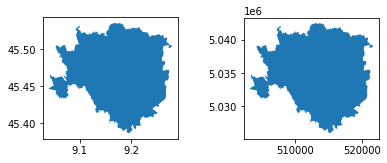

time: 458 ms (started: 2021-08-15 11:04:12 +02:00)


In [3]:
# load Milan city from openstreetmap using osmmnx api

city_name = 'Milan, Italy'
city = ox.geocode_to_gdf(city_name)
print('Milan coordinate reference system: ', city.crs)

# project to the local coordinate reference system
city_proj = ox.projection.project_gdf(city)
print('Projected Milan coordinate reference system: ', city_proj.crs)

fig, (ax1, ax2) = plt.subplots(1, 2)
city.plot(ax=ax1, ec='none')
city_proj.plot(ax=ax2, ec='none' )
plt.tight_layout(pad=3.0)
plt.show()

In [4]:
# convert to "ESRI:54009" coordinate system, since that's the system NASA uses
city = city.to_crs("ESRI:54009") 
print(city.crs)

ESRI:54009
time: 238 ms (started: 2021-08-15 11:04:13 +02:00)


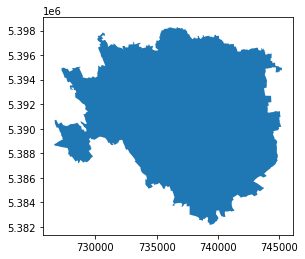

time: 130 ms (started: 2021-08-15 11:04:13 +02:00)


In [5]:
# plot city in new projection
ax = city.plot(ec='none')


In [6]:
# save to file
city.to_file('Milan_54009.shp')

time: 77.2 ms (started: 2021-08-15 11:04:13 +02:00)


<ipython-input-6-966cdee5590e>:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file('Milan_54009.shp')


In [7]:
# load the saved file
import fiona
with fiona.open("Milan_54009.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

time: 188 ms (started: 2021-08-15 11:04:13 +02:00)


In [8]:
# load the NASA population density raster file
# Data source: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4
import rasterio.mask
with rasterio.open("data/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0.tif") as src:
    # since the NASA data is for the entire world, we will use the 'shapes' polygon containing our city to mask out
    # the population raster data corresponding to our city
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True, nodata=0)
    out_meta = src.meta

time: 133 ms (started: 2021-08-15 11:04:14 +02:00)


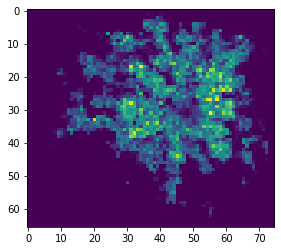

time: 114 ms (started: 2021-08-15 11:04:14 +02:00)


In [9]:
plt.imshow(out_image[0])

In [10]:
# since the raster array contains many dimensions, we assign the dimension containing the population density data to a new 
# variable
pop_density = out_image[0,:,:]
pop_density

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

time: 3.34 ms (started: 2021-08-15 11:04:14 +02:00)


In [11]:
# just in case, set all negative values to zero
pop_density[pop_density < 0] = 0

time: 455 µs (started: 2021-08-15 11:04:14 +02:00)


In [12]:
# split city into 400 x 400 meter grid cells
geometry = city_proj['geometry'].iloc[0]
print(type(geometry))
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 400)
print(type(geometry_cut))

<class 'shapely.geometry.polygon.Polygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
time: 6.09 s (started: 2021-08-15 11:04:14 +02:00)


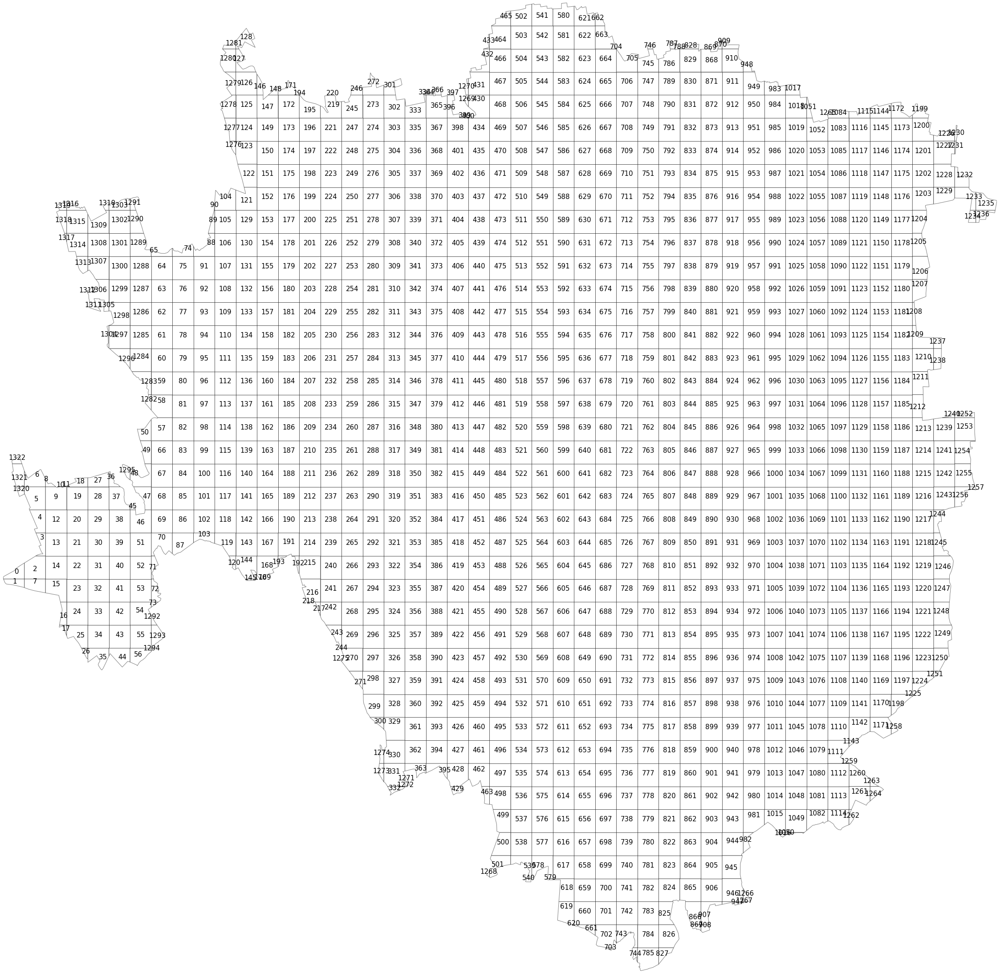

time: 7.16 s (started: 2021-08-15 11:04:20 +02:00)


In [13]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city_proj.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [14]:
# create geodataframe from the square grid polygons
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_proj.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((503197.317 5032658.859, 503202.066 5..."
1,"POLYGON ((503591.542 5032635.490, 503591.542 5..."
2,"POLYGON ((503591.542 5032909.514, 503804.443 5..."
3,"POLYGON ((503804.443 5033029.836, 503837.189 5..."
4,"POLYGON ((503807.363 5033424.181, 503777.065 5..."


time: 25.8 ms (started: 2021-08-15 11:04:27 +02:00)


<AxesSubplot:>

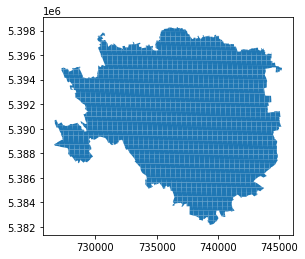

time: 614 ms (started: 2021-08-15 11:04:27 +02:00)


In [15]:
# convert to the NASA crs we introduced earlier
polyframe= polyframe.to_crs(city.crs)
polyframe.plot()

In [16]:
# load library for aggregating raster data into vector polygons
from rasterstats import zonal_stats

time: 83.8 ms (started: 2021-08-15 11:04:28 +02:00)


In [17]:
# compute the mean value of all raster values that fall into a given quadratic cell

affine = out_transform
city_stats = zonal_stats(polyframe, pop_density, affine=affine, stats='mean', nodata=0)
pop_array = np.array([list(item.values())[0] if list(item.values())[0] is not None else 0 for item in city_stats])
print(pop_array)

[40.32780457  4.24924612  0.74573342 ...  2.20441222  0.
  0.        ]
time: 1.3 s (started: 2021-08-15 11:04:28 +02:00)


In [18]:
city_stats[:10]

[{'mean': 40.32780456542969},
 {'mean': 4.249246120452881},
 {'mean': 0.745733417570591},
 {'mean': 2.713408946990967},
 {'mean': None},
 {'mean': 24.005563735961914},
 {'mean': 0.096488818526268},
 {'mean': 0.8694548010826111},
 {'mean': None},
 {'mean': 3.5187740325927734}]

time: 2.39 ms (started: 2021-08-15 11:04:29 +02:00)


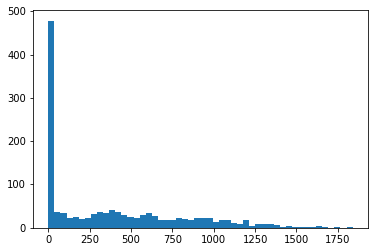

time: 153 ms (started: 2021-08-15 11:04:29 +02:00)


In [19]:
# plot histogram of the obtained population density values
plt.hist(pop_array, bins=50)
plt.show()

In [20]:
# assign the population values as a new column in the geodataframe with the grid cells, 
# so we know which grid cell has what population.

polyframe["population"] = pop_array
polyframe.head()

,geometry,population
0,"POLYGON ((726632.539 5388716.142, 726636.552 5...",40.327805
1,"POLYGON ((727039.421 5388693.181, 727050.077 5...",4.249246
2,"POLYGON ((727019.603 5388959.985, 727229.731 5...",0.745733
3,"POLYGON ((727229.731 5389077.013, 727262.051 5...",2.713409
4,"POLYGON ((727204.215 5389460.956, 727168.253 5...",0.000000


time: 21.9 ms (started: 2021-08-15 11:04:29 +02:00)


(256, 4)
[[1.         0.96078431 0.94117647 1.        ]
 [0.99987697 0.95820069 0.93748558 1.        ]
 [0.99975394 0.95561707 0.93379469 1.        ]
 ...
 [0.41917724 0.00369089 0.05294887 1.        ]
 [0.4115494  0.00184544 0.05196463 1.        ]
 [0.40392157 0.         0.05098039 1.        ]]


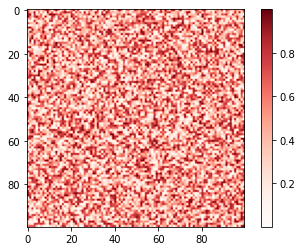

time: 186 ms (started: 2021-08-15 11:04:29 +02:00)


In [21]:
# in order to achieve a nice-looking visualisation, let's create a custom colormap, that fades away into transparency

ncolors = 256
# get cmap
color_array = plt.get_cmap('Reds')(range(ncolors))
print(color_array.shape)
print(color_array)

# change alpha values
color_array[:, -1] = np.linspace(0.3, 1, ncolors)

# create colormap object
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

map_object = LinearSegmentedColormap.from_list(name="Reds_transp", colors=color_array)

# register the colormap object
plt.register_cmap(cmap=map_object)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap='Reds_transp')
plt.colorbar(mappable=h)

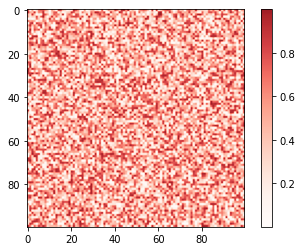

time: 175 ms (started: 2021-08-15 11:04:29 +02:00)


In [22]:
# let's cut it at the top for a better visual impact

def trunc_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list('trunc({n}, {a:.2f}, {b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                                                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Reds_transp')
new_cmap = trunc_colormap(cmap, 0.0, .9)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap=new_cmap)
plt.colorbar(mappable=h)

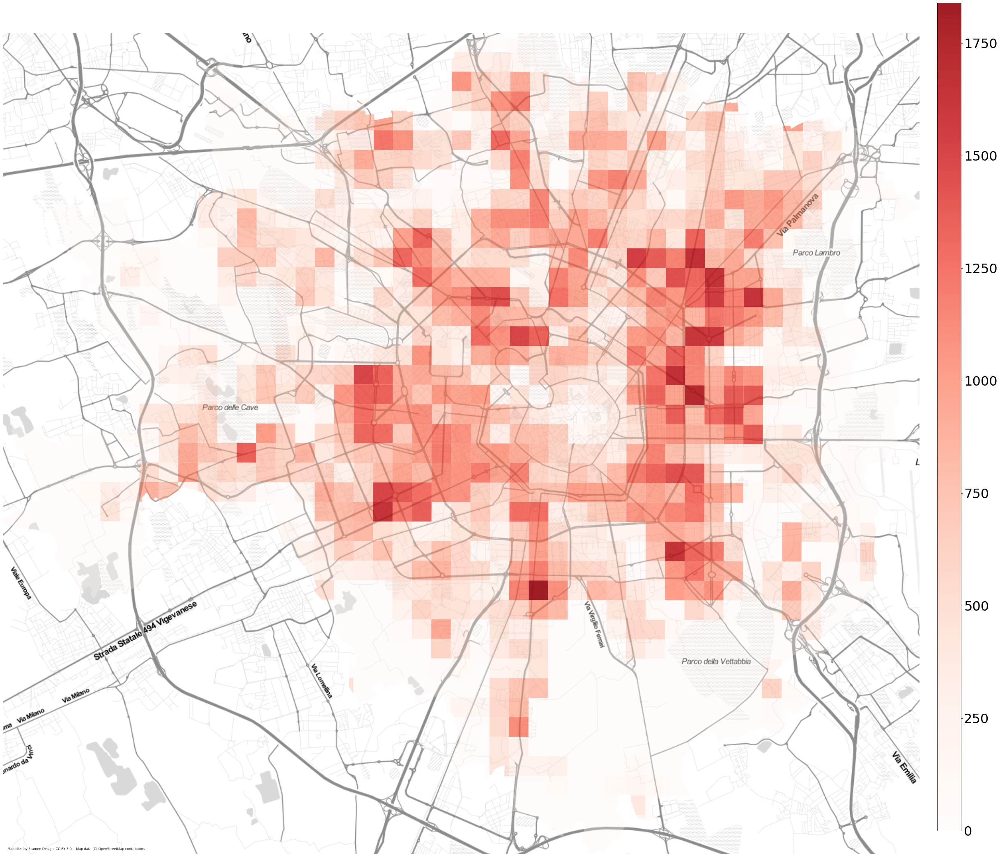

time: 8.78 s (started: 2021-08-15 11:04:30 +02:00)


In [23]:
# plot the population density data on a map background
plt.rcParams.update({'font.size':32})
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

#ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

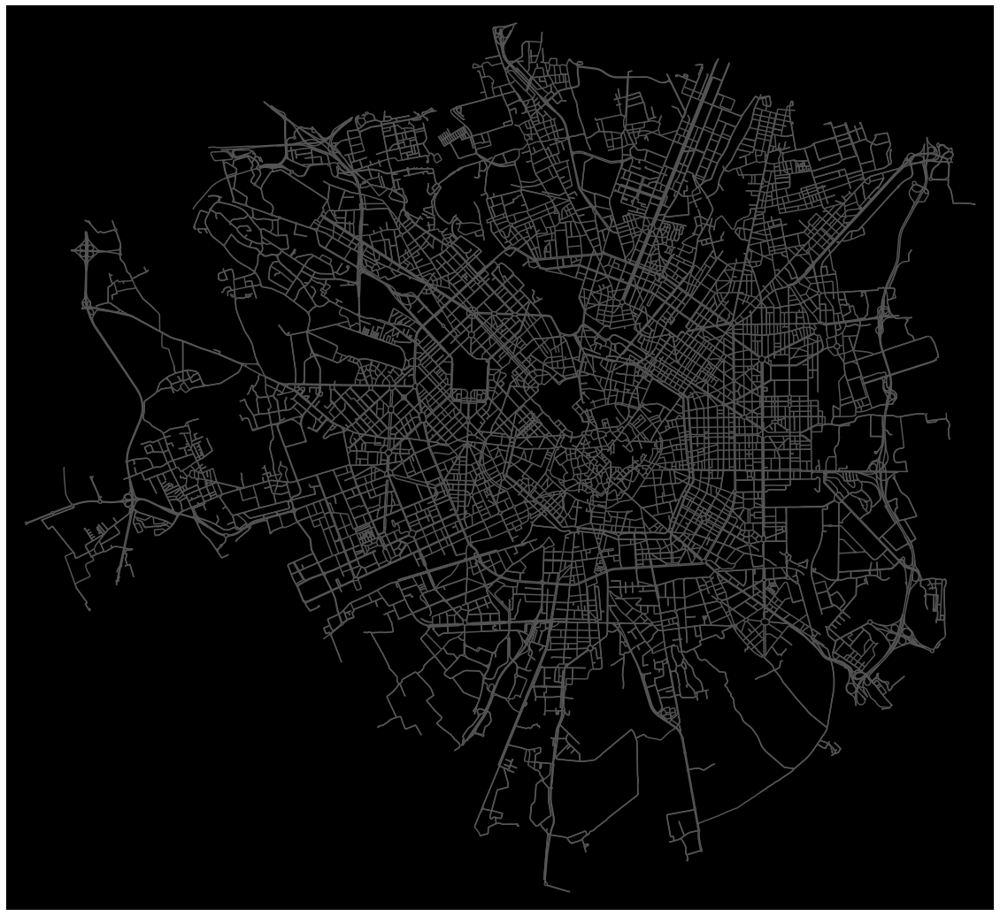

time: 25.3 s (started: 2021-08-15 11:04:38 +02:00)


In [24]:
# download and project a street network
G = ox.graph_from_place(city_name, network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, figsize=(20,20), bgcolor='k', node_size=0, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

In [25]:
# set new coordinate reference system
from pyproj import CRS
crs = CRS.from_epsg(4326)
polyframe_gps = polyframe.to_crs(crs)
print(polyframe_gps.crs)

epsg:4326
time: 288 ms (started: 2021-08-15 11:05:04 +02:00)


<ipython-input-26-0e3ed00070c8>:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


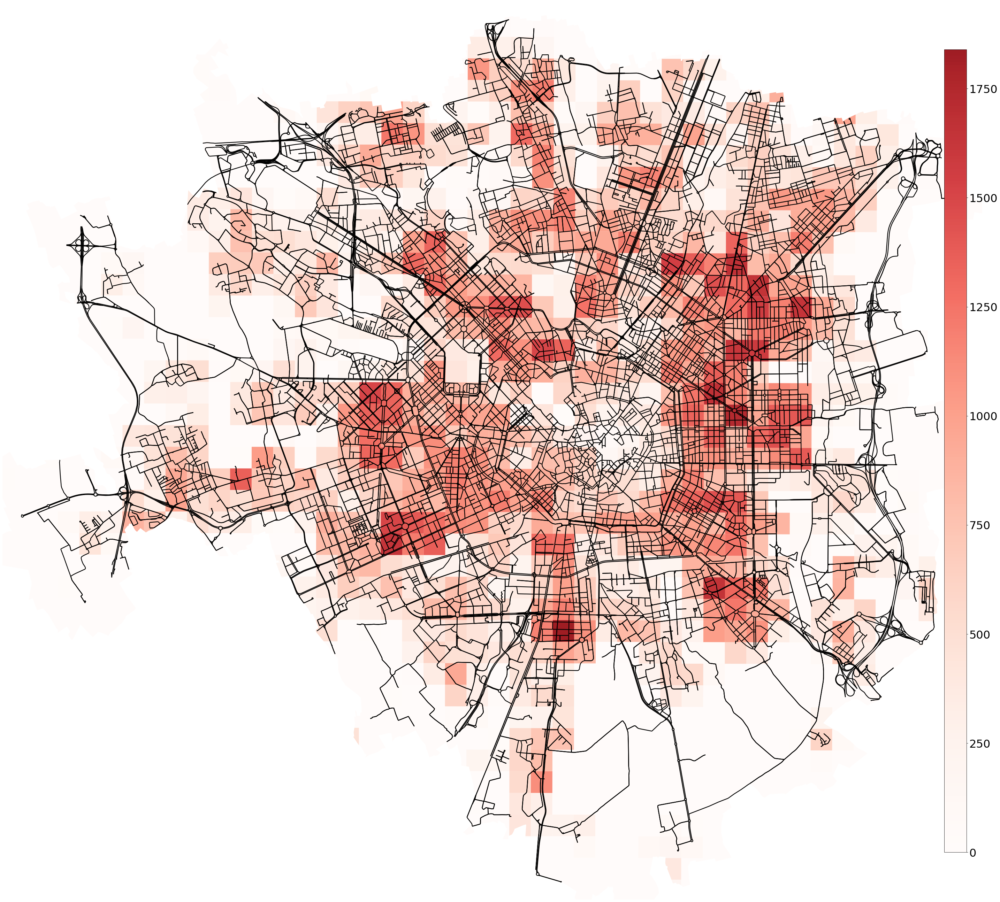

time: 5.06 s (started: 2021-08-15 11:05:04 +02:00)


In [26]:
fig, ax = plt.subplots(figsize=(40,40))

#plt.close()
polyframe_gps.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

ox.plot_graph(G, ax=ax, figsize=(40,40),show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=2.25, node_alpha=0.8, node_zorder=10,
              edge_color='black')

cbax = fig.add_axes([0.95, 0.1, 0.0225, 0.8])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_gps.population), vmax=max(polyframe_gps.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.axis('off')
plt.tight_layout()
#plt.savefig('../data/Milan_pop_density_with_streets.jpg', dpi=150)
plt.show()

In [27]:
# let's get a list containing the street network node IDs
graph = G.nodes(data=True)
nodelist = [x[0] for x in graph]
nodelist[:10]

[10371529,
 10371530,
 13595397,
 13598756,
 13598788,
 13919619,
 13919627,
 13919638,
 13919640,
 13919646]

time: 4.26 ms (started: 2021-08-15 11:05:09 +02:00)


In [28]:
# then, we create a dataframe containing features of the street nodes (junctions)
from tqdm import tqdm
street_dict = {'osmid':[], 'lon':[], 'lat':[], 'street_count':[]}
for node in tqdm(nodelist):
    street_dict['osmid'].append(node)
    street_dict['lon'].append(graph[node]['x'])
    street_dict['lat'].append(graph[node]['y'])
    street_dict['street_count'].append(graph[node]['street_count'])
    
street_frame = pd.DataFrame(street_dict)
street_frame.head(10)

100%|██████████| 13112/13112 [00:00<00:00, 420446.89it/s]


,osmid,lon,lat,street_count
0,10371529,9.076625,45.487563,3
1,10371530,9.102055,45.479804,3
2,13595397,9.130656,45.499516,4
3,13598756,9.163773,45.482751,4
4,13598788,9.157376,45.487319,3
5,13919619,9.156166,45.484810,3
6,13919627,9.157687,45.487773,5
7,13919638,9.160314,45.490487,3
8,13919640,9.153752,45.486130,4
9,13919646,9.165737,45.490573,4


time: 74.1 ms (started: 2021-08-15 11:05:09 +02:00)


In [29]:
# let's create Point geometries from the lat, lon pairs. 
geometry = [Point(xy) for xy in zip(street_frame.lon, street_frame.lat)]
street_frame = street_frame.drop(['lon', 'lat'], axis=1)
gdf = gpd.GeoDataFrame(street_frame, crs=crs, geometry=geometry)
gdf.tail()

,osmid,street_count,geometry
13107,8823682863,4,POINT (9.14841 45.48281)
13108,8823682864,4,POINT (9.14862 45.48295)
13109,8823682865,4,POINT (9.14874 45.48287)
13110,8823682866,4,POINT (9.14864 45.48281)
13111,8823682867,4,POINT (9.14853 45.48273)


time: 305 ms (started: 2021-08-15 11:05:09 +02:00)


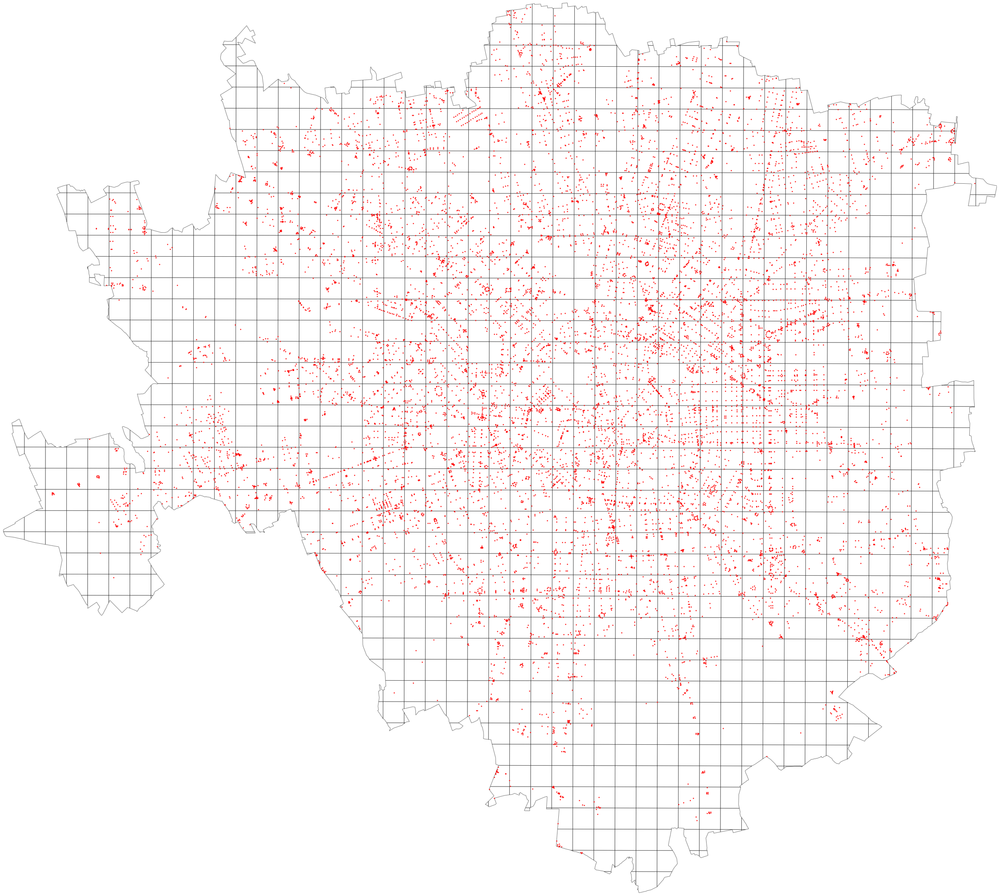

time: 2.75 s (started: 2021-08-15 11:05:10 +02:00)


In [30]:
west, south, east, north = polyframe_gps.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(polyframe_gps.geometry, np.arange(len(polyframe_gps))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)
gdf.plot(ax=ax, color='red', markersize=2, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [31]:
pointInPoly = gpd.sjoin(polyframe_gps, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

13104


,geometry,population,index_right,osmid,street_count
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,5108,273512549,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10061,2268397492,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,11037,2720117948,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,11038,2720117950,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10070,2268397749,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10063,2268397617,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10066,2268397659,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,10071,2268397755,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,7122,595649878,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,10073,2268397862,3


time: 577 ms (started: 2021-08-15 11:05:12 +02:00)


In [32]:
streetcounts = pointInPoly.groupby(pointInPoly.index)['index_right'].count()
counts = pd.DataFrame(streetcounts)
counts.columns = ['counts']
counts

,counts
13,7
20,8
27,1
29,8
31,1
...,...
1300,4
1301,10
1302,8
1305,1


time: 6.99 ms (started: 2021-08-15 11:05:13 +02:00)


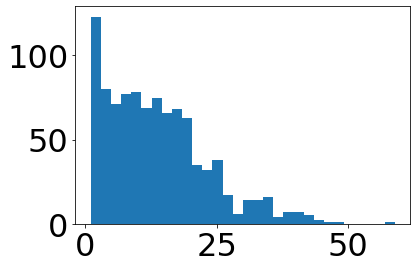

time: 97.7 ms (started: 2021-08-15 11:05:13 +02:00)


In [33]:
# a quick histogram of the street node counts
plt.hist(counts.counts, bins=30)
plt.show()

In [34]:
polycounts = polyframe_gps.copy()
polycounts['counts'] = counts.counts
polycounts['counts'].fillna(0, inplace=True)
polycounts['counts'] = polycounts['counts'].astype(int)
polycounts

,geometry,population,counts
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0
...,...,...,...
1318,"POLYGON ((9.05555 45.50047, 9.05543 45.50074, ...",0.000000,0
1319,"POLYGON ((9.05440 45.50402, 9.05385 45.50486, ...",0.656113,0
1320,"POLYGON ((9.04594 45.46031, 9.04475 45.45995, ...",2.204412,0
1321,"POLYGON ((9.04404 45.46143, 9.04297 45.46369, ...",0.000000,0


time: 99.8 ms (started: 2021-08-15 11:05:13 +02:00)


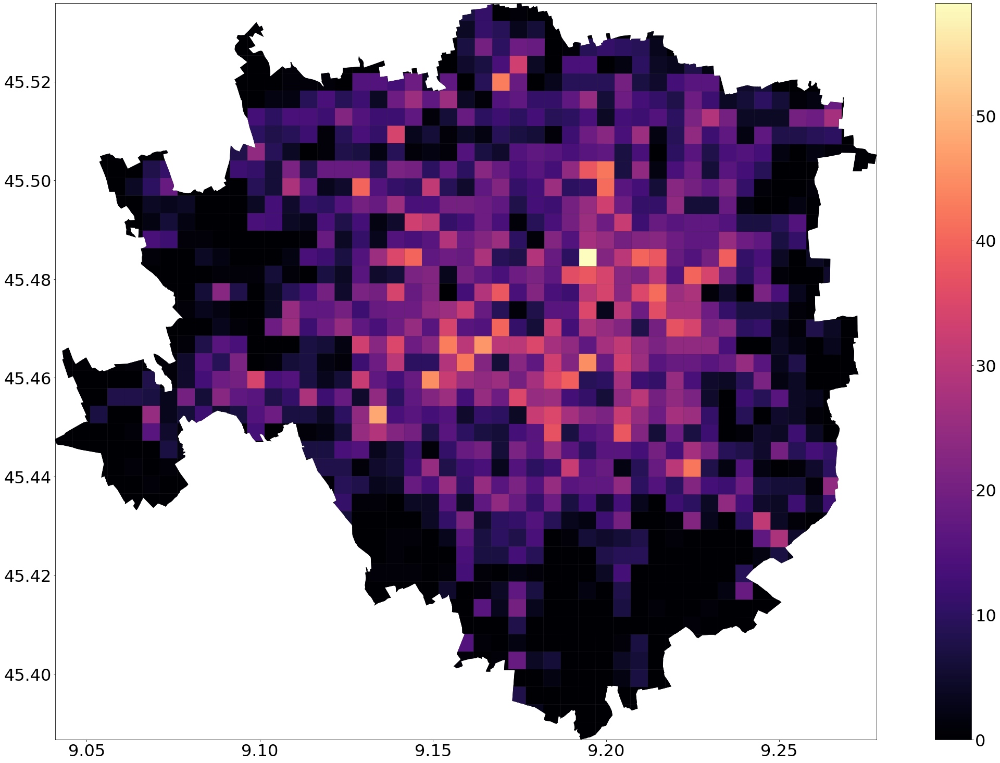

time: 1.29 s (started: 2021-08-15 11:05:13 +02:00)


In [35]:
# plot the city street network density
west, south, east, north = polycounts.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polycounts.plot(column='counts',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

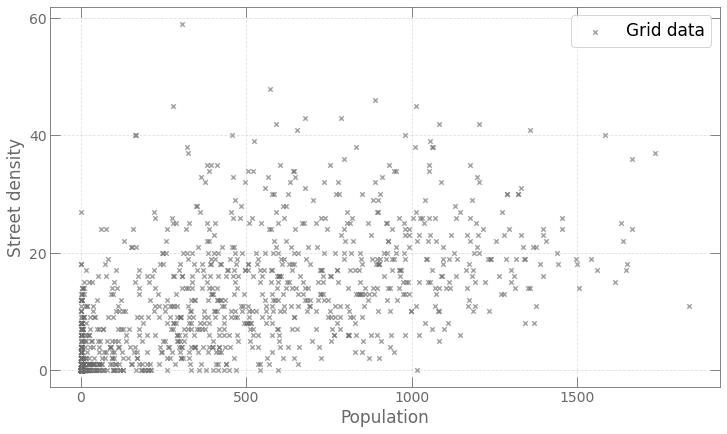

time: 122 ms (started: 2021-08-15 11:05:14 +02:00)


In [36]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(polycounts.population, polycounts.counts, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', label = "Grid data", s=20)

ax.legend(prop={'size': 17})
plt.xlabel('Population', size=17, color='dimgrey')
plt.ylabel('Street density', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
plt.show()

In [37]:
np.corrcoef(polycounts.population,polycounts.counts)

array([[1.        , 0.64896335],
       [0.64896335, 1.        ]])

time: 3.13 ms (started: 2021-08-15 11:05:15 +02:00)


In [38]:
import pandana

time: 6.57 ms (started: 2021-08-15 11:05:15 +02:00)


In [39]:
from pandana.loaders import osm

import warnings
warnings.filterwarnings('ignore')

time: 1.25 ms (started: 2021-08-15 11:05:15 +02:00)


In [40]:
# get bounding box of city first
west, south, east, north = polycounts.unary_union.bounds
print(west, south, east, north)

9.040886699999996 45.38673809999998 9.278110299999998 45.535848199999975
time: 178 ms (started: 2021-08-15 11:05:15 +02:00)


In [41]:
network = osm.pdna_network_from_bbox(south, west, north, east)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](45.38673810,9.04088670,45.53584820,9.27811030);>;);out;'}"
Downloaded 51,780.4KB from www.overpass-api.de in 11.69 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 12.73 seconds
Returning OSM data with 306,724 nodes and 86,817 ways...
Edge node pairs completed. Took 71.11 seconds
Returning processed graph with 101,745 nodes and 148,337 edges...
Completed OSM data download and Pandana node and edge table creation in 89.19 seconds
time: 1min 36s (started: 2021-08-15 11:05:15 +02:00)


In [42]:
network.nodes_df.head()

,x,y
id,,
10371529,9.076625,45.487563
10371530,9.102055,45.479804
13595397,9.130656,45.499516
13598756,9.163773,45.482751
13598788,9.157376,45.487319


time: 5.72 ms (started: 2021-08-15 11:06:52 +02:00)


In [43]:
network.edges_df.head()

from          to    distance
10371529 743371622   10371529   743371622  150.145208
         743371634   10371529   743371634  154.478305
10371530 2754112526  10371530  2754112526   30.262968
13595397 344814479   13595397   344814479   17.388362
13598756 2661005332  13598756  2661005332   23.940970

time: 11.3 ms (started: 2021-08-15 11:06:52 +02:00)


In [44]:
restaurants = osm.node_query(
    south, west, north, east, tags='"amenity"="restaurant"')

time: 3.99 s (started: 2021-08-15 11:06:52 +02:00)


In [45]:
restaurants.head()

,lat,lon,amenity,name,fixme,cuisine,addr:city,addr:country,addr:housenumber,addr:postcode,...,phone:mobile,opening_hours:kitchen,wikidata,wikimedia_commons,wikipedia,delivery:deliveroo,ref:delivery:deliveroo,opening_hours:takeaway,payment:apple_pay,ref:justeat
id,,,,,,,,,,,,,,,,,,,,,
29978508,45.461301,9.154473,restaurant,La Brasserie de Milan,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91533563,45.460429,9.175277,restaurant,Ancora,posizione,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
258076664,45.488549,9.165327,restaurant,La Mela Bianca,NaN,italian;pizza,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
260349649,45.491012,9.239116,restaurant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
260349669,45.491240,9.244445,restaurant,NU,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


time: 15.2 ms (started: 2021-08-15 11:06:56 +02:00)


In [46]:
restaurant_nodes = network.get_node_ids(restaurants.lon, restaurants.lat)
network.set(restaurant_nodes, 
            name = 'restaurants')

time: 32.2 ms (started: 2021-08-15 11:06:56 +02:00)


In [47]:
accessibility = network.aggregate(distance = 500,
                                  type = 'count',
                                  name = 'restaurants')
accessibility.describe()

count    101745.000000
mean         10.141540
std          15.358479
min           0.000000
25%           0.000000
50%           3.000000
75%          13.000000
max          88.000000
dtype: float64

time: 859 ms (started: 2021-08-15 11:06:56 +02:00)


In [48]:
accessibility.head()

id
10371529     0.0
10371530     1.0
13595397     8.0
13598756    43.0
13598788    16.0
dtype: float64

time: 3.26 ms (started: 2021-08-15 11:06:57 +02:00)


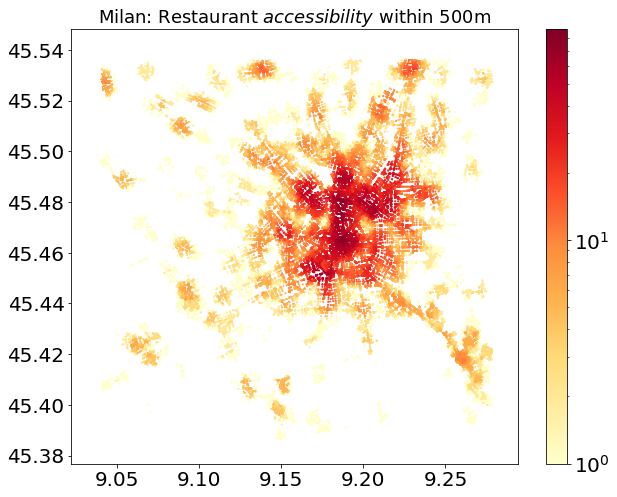

time: 1.29 s (started: 2021-08-15 11:06:57 +02:00)


In [49]:

import matplotlib
plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(10,8))

plt.title('Milan: Restaurant $accessibility$ within 500m', size = 18)
plt.scatter(network.nodes_df.x, network.nodes_df.y, 
            c=accessibility, s=1, cmap='YlOrRd', 
            norm=matplotlib.colors.LogNorm())
cb = plt.colorbar()

plt.show()

In [50]:
network_nodes = network.nodes_df
network_nodes.head()

,x,y
id,,
10371529,9.076625,45.487563
10371530,9.102055,45.479804
13595397,9.130656,45.499516
13598756,9.163773,45.482751
13598788,9.157376,45.487319


time: 4.63 ms (started: 2021-08-15 11:06:58 +02:00)


In [51]:
network_nodes['accessibility'] = accessibility
network_nodes.head()

,x,y,accessibility
id,,,
10371529,9.076625,45.487563,0.0
10371530,9.102055,45.479804,1.0
13595397,9.130656,45.499516,8.0
13598756,9.163773,45.482751,43.0
13598788,9.157376,45.487319,16.0


time: 7.61 ms (started: 2021-08-15 11:06:58 +02:00)


In [52]:
geometry = [Point(xy) for xy in zip(network_nodes.x, network_nodes.y)]
network_nodes = network_nodes.drop(['x', 'y'], axis=1)
network_gdf = gpd.GeoDataFrame(network_nodes, crs=crs, geometry=geometry)
network_gdf.head()

,accessibility,geometry
id,,
10371529,0.0,POINT (9.07662 45.48756)
10371530,1.0,POINT (9.10206 45.47980)
13595397,8.0,POINT (9.13066 45.49952)
13598756,43.0,POINT (9.16377 45.48275)
13598788,16.0,POINT (9.15738 45.48732)


time: 2.27 s (started: 2021-08-15 11:06:58 +02:00)


In [53]:
len(network_gdf)

101745

time: 1.59 ms (started: 2021-08-15 11:07:00 +02:00)


In [54]:
pointInPoly = gpd.sjoin(polyframe_gps, network_gdf, op='contains')

time: 2.55 s (started: 2021-08-15 11:07:00 +02:00)


In [55]:

print(len(pointInPoly))
pointInPoly.head(10)

74177


,geometry,population,index_right,accessibility
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,4634855007,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,4634855008,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,4634855005,0.0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,2786370504,0.0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,4629639627,0.0
5,"POLYGON ((9.04718 45.45788, 9.04708 45.45803, ...",24.005564,2720117963,0.0
7,"POLYGON ((9.05097 45.44723, 9.05097 45.44510, ...",0.869455,2093536135,0.0
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,2268397749,0.0
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,2268397617,0.0
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,2268397659,0.0


time: 21.9 ms (started: 2021-08-15 11:07:03 +02:00)


In [67]:
aggr_access = pointInPoly.groupby(pointInPoly.index)['accessibility'].mean()
aggr_access_df = pd.DataFrame(aggr_access)
aggr_access_df.columns = ['aggr_access']
aggr_access_df

,aggr_access
2,0.0
3,0.0
4,0.0
5,0.0
7,0.0
...,...
1312,1.0
1313,0.0
1314,0.0
1315,0.0


time: 10.3 ms (started: 2021-08-15 11:09:26 +02:00)


In [68]:
aggr_access_df.value_counts()

aggr_access
0.000000       339
1.000000        31
1.500000         6
0.250000         5
0.500000         5
              ... 
2.045455         1
2.055556         1
2.072727         1
2.097561         1
64.878173        1
Length: 733, dtype: int64

time: 7.67 ms (started: 2021-08-15 11:09:28 +02:00)


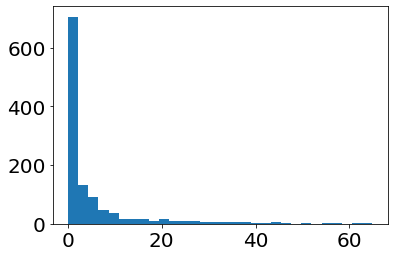

time: 124 ms (started: 2021-08-15 11:09:30 +02:00)


In [69]:
# a quick histogram of the aggregated accessibility
plt.hist(aggr_access_df.aggr_access, bins=30)
plt.show()

In [70]:
polyaccess = polyframe_gps.copy()
polyaccess['aggr_access'] = aggr_access_df.aggr_access
polyaccess['aggr_access'].fillna(0, inplace=True)
#polyaccess['aggr_access'] = polyaccess['aggr_access'].astype(int)
polyaccess

,geometry,population,aggr_access
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0.0
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0.0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0.0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0.0
...,...,...,...
1318,"POLYGON ((9.05555 45.50047, 9.05543 45.50074, ...",0.000000,0.0
1319,"POLYGON ((9.05440 45.50402, 9.05385 45.50486, ...",0.656113,0.0
1320,"POLYGON ((9.04594 45.46031, 9.04475 45.45995, ...",2.204412,0.0
1321,"POLYGON ((9.04404 45.46143, 9.04297 45.46369, ...",0.000000,0.0


time: 123 ms (started: 2021-08-15 11:09:34 +02:00)


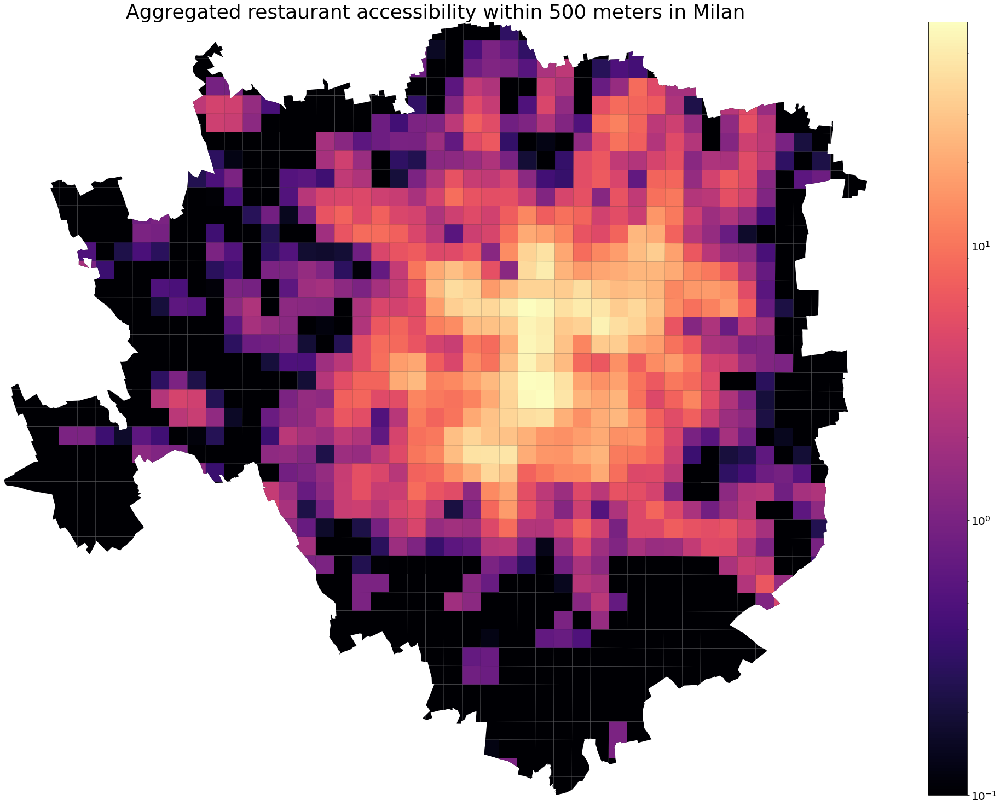

time: 1.15 s (started: 2021-08-15 11:09:39 +02:00)


In [71]:
# plot the city aggregated accessibility

LOGMIN = 0.1  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='aggr_access',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Aggregated restaurant accessibility within 500 meters in Milan", size = 36)
ax.axis('off')
plt.show()

In [72]:
polyaccess["pop_int"] = polyaccess.population.astype(int) + 1
polyaccess.head()

,geometry,population,aggr_access,pop_int
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0.0,41
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0.0,5
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0.0,1
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0.0,3
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0.0,1


time: 28.9 ms (started: 2021-08-15 11:09:43 +02:00)


In [73]:
polyaccess["access_normalised"] = polyaccess.aggr_access / polyaccess.pop_int 
polyaccess.head()

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0.0,41,0.0
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0.0,5,0.0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0.0,1,0.0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0.0,3,0.0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0.0,1,0.0


time: 28.2 ms (started: 2021-08-15 11:09:44 +02:00)


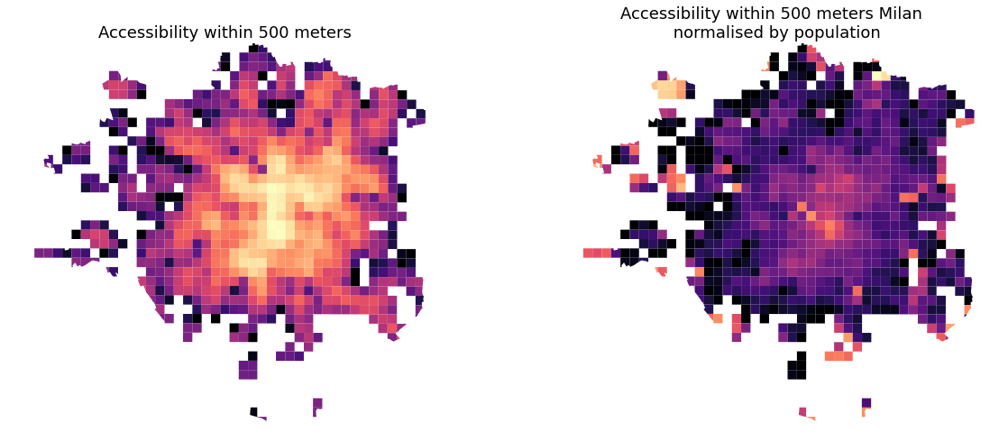

time: 848 ms (started: 2021-08-15 11:10:05 +02:00)


In [76]:
f, ax = plt.subplots(1,2,figsize=(20,8))

polyaccess.plot(column='aggr_access', ax = ax[0], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma')   
  
ax[0].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("Accessibility within 500 meters", size = 18)


polyaccess.plot(column='access_normalised', ax = ax[1], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), 0.001), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma')

ax[1].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Accessibility within 500 meters Milan \n normalised by population", size = 18)
ax[0].axis('off')
ax[1].axis('off')
plt.show()

In [77]:
sum(polyaccess.access_normalised)

94.9422053414368

time: 2.62 ms (started: 2021-08-15 11:10:12 +02:00)


In [80]:
#print final score
polyaccess.access_normalised.mean()

0.07176281582875042

time: 2.43 ms (started: 2021-08-15 11:46:40 +02:00)


In [79]:
polyaccess.aggr_access.mean()

4.741603859783618

time: 2.62 ms (started: 2021-08-15 11:10:15 +02:00)


In [81]:
sum(polyaccess.pop_int)

513407

time: 2.5 ms (started: 2021-08-15 12:09:39 +02:00)


In [82]:
sum(polyaccess.access_normalised)

94.9422053414368

time: 72 ms (started: 2021-08-16 16:03:06 +02:00)
